### 1. Imports

In [1]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import scipy
import plotly.graph_objects as go
from scipy.ndimage import label
from skimage.measure import marching_cubes
from sklearn.neighbors import NearestNeighbors

### 2. Functions

In [39]:
def carve_voxel_grid_with_masks(voxel_grid, combined_mask):
    """
    Carve a voxel grid using:
    - voxel_grid: (H, W, D) or (H, W, D, 3)
    - combined_mask: (H, W) binary or (H, W, 3) RGB
    """
    shape = voxel_grid.shape
    is_color = voxel_grid.ndim == 4 and shape[3] == 3
    H, W, D = shape[:3]

    # Check mask shape and transpose if needed
    if combined_mask.shape[:2] == (W, H):
        combined_mask = combined_mask.T
    if combined_mask.shape[:2] != (H, W):
        raise ValueError(f"Mask shape {combined_mask.shape} does not match voxel grid shape {shape}")

    # Binary mask case (H, W)
    if combined_mask.ndim == 2:
        mask3d = combined_mask[:, :, None, None] if is_color else combined_mask[:, :, None]
        mask3d = np.broadcast_to(mask3d, voxel_grid.shape)
        voxel_grid = np.where(mask3d, voxel_grid, 0)

    # RGB mask case (H, W, 3)
    elif combined_mask.ndim == 3 and combined_mask.shape[2] == 3:
        if not is_color:
            raise ValueError("Color mask provided but voxel grid has no color channels.")
        for c in range(3):
            mask_channel = combined_mask[:, :, c][:, :, None, None]
            mask_channel = np.broadcast_to(mask_channel, voxel_grid.shape)
            voxel_grid[..., c] = np.where(mask_channel, voxel_grid[..., c], 0)

    else:
        raise ValueError(f"Unsupported mask shape {combined_mask.shape}")

    return voxel_grid

def rotate_voxel_grid(voxel_grid, angle_degrees, rotation_center):
    """Rotate the voxel grid and color grid around the Y-axis by the given angle."""
    angle_radians = np.deg2rad(angle_degrees)
    cos_angle = np.cos(angle_radians)
    sin_angle = np.sin(angle_radians)
    rotation_matrix = np.array([
        [cos_angle, 0, sin_angle],
        [0, 1, 0],
        [-sin_angle, 0, cos_angle]
    ])
    rotation_matrix_inv = np.linalg.inv(rotation_matrix)
    offset = rotation_center - np.dot(rotation_matrix_inv, rotation_center)
    
    rotated_voxel_grid = scipy.ndimage.affine_transform(voxel_grid, rotation_matrix_inv, offset=offset, order=1, mode='constant', cval=0)
   
    return rotated_voxel_grid

def process_voxel_grid(voxel_grid, combined_mask,angle_interval=90):
    """
    Process voxel grid with masks and rotations at specified intervals within a quadrant.
    Only the parts of the grid defined in target_masks are rotated and carved.
    """
    # Carve the voxel grid using the masks
    
    rotation_center = np.array(voxel_grid.shape) / 2

    carved_grid = voxel_grid
    for angle in tqdm(range(0, 91, angle_interval), desc='90 Carving'):
                rotated_grid = rotate_voxel_grid(carved_grid, angle, rotation_center)

                carved_grid = carve_voxel_grid_with_masks(rotated_grid, combined_mask)
    return carved_grid

def apply_colored_mask_to_voxel_grid(carved_voxel_grid, colored_mask):
    w, h, d = carved_voxel_grid.shape

    # Align orientation
    mask = np.transpose(colored_mask, (1, 0, 2))  # match carving
    colored_mask_3d = np.repeat(mask[:, :, np.newaxis, :], d, axis=2)

    colored_voxel_grid = np.zeros((w, h, d, 3), dtype=np.uint8)

    for i in range(3):
        colored_voxel_grid[:, :, :, i] = np.where(carved_voxel_grid == 1, colored_mask_3d[:, :, :, i], 0)

    print("Non-zero colored voxels:", np.count_nonzero(colored_voxel_grid))
    return colored_voxel_grid

def part_carve(colored_grid, semantic_mask, visualize=False):
    """
    Part‐wise carving of a colored voxel grid.
    Assumes `group_jobs` and `part_colors` are defined globally.
    """
    W, H, D, _ = colored_grid.shape
    final = np.zeros_like(colored_grid)

    for names, angle in group_jobs:
        # Build a 2D mask where semantic_mask matches any RGB in `names`
        mask2d = np.any(
            np.stack([np.all(semantic_mask == part_colors[n], axis=-1) for n in names]),
            axis=0
        )
        if not mask2d.any():
            continue

        # Transpose + uint8, extract this group's voxels
        m = mask2d.T.astype(np.uint8)              # shape = (W, H)
        sub = colored_grid * m[:, :, None, None]   # shape = (W, H, D, 3)

        # Carve occupancy
        occ = (np.any(sub > 0, axis=-1)).astype(np.uint8)  # (W, H, D)
        carved = process_voxel_grid(occ, m, angle_interval=angle)
        part = sub * carved[:, :, :, None]                 # (W, H, D, 3)

        # Optional visualize
        if visualize:
            pts, cols, _ = voxel_grid_to_points(downsample_voxel_grid(part, 4))
            plot_voxel(pts, cols)

        # Merge into final
        mask_any = np.any(part > 0, axis=-1)  # (W, H, D)
        final[mask_any] = part[mask_any]

    return final

def left_right_guided_carve(colored_grid, semantic_mask, target_color, angle=60, visualize=False):
    """
    For a given part color:
    1. Find 2D components in the semantic mask
    2. Find 3D components in the voxel grid with the same color
    3. Match each 2D component to the correct 3D component via XY bounding box
    4. Carve each 3D component using the corresponding 2D cropped mask (projected along depth)
    5. Replace original part with carved result
    """
    from scipy.ndimage import label
    import numpy as np

    W, H, D, _ = colored_grid.shape
    carved_grid = colored_grid.copy()

    # Step 1: 2D color mask → connected components
    mask2d = np.all(semantic_mask == target_color, axis=-1).astype(np.uint8)  # shape (H, W)
    if not np.any(mask2d):
        print(f"[SKIP] No mask found for color {target_color}")
        return carved_grid

    labeled_2d, num_2d = label(mask2d)
    print(f"[{target_color}] Found {num_2d} 2D components")

    # Step 2: 3D voxel mask → connected components
    color_mask_3d = np.all(colored_grid == target_color, axis=-1).astype(np.uint8)
    labeled_3d, num_3d = label(color_mask_3d)
    print(f"           Found {num_3d} 3D components")

    # Step 3: Loop over 3D components
    for j in range(1, num_3d + 1):
        mask3d = (labeled_3d == j)
        coords = np.argwhere(mask3d)
        if coords.shape[0] == 0:
            continue

        x0, y0, z0 = coords.min(axis=0)
        x1, y1, z1 = coords.max(axis=0) + 1

        print(f" - 3D Component {j} | BBox=({x0},{y0},{z0})→({x1},{y1},{z1})")

        # Step 4: Use 3D component's XY bounds to crop 2D mask
        H_mask, W_mask = mask2d.shape  # semantic mask shape is (H, W)
        if x1 > W_mask or y1 > H_mask:
            print("   ⚠️ 3D bbox outside semantic mask bounds, skipping.")
            continue

        matched_crop_2d = mask2d[y0:y1, x0:x1]  # shape (H, W)

        # Step 5: Extract subgrid & occupancy
        subgrid = colored_grid[x0:x1, y0:y1, z0:z1, :].copy()  # shape (W, H, D, 3)
        occ = np.any(subgrid > 0, axis=-1).astype(np.uint8)    # shape (W, H, D)

        # Step 6: Project 2D mask into 3D
        mask_3d = np.repeat(matched_crop_2d[:, :, None], z1 - z0, axis=2)  # (H, W, D)
        mask_3d = mask_3d.transpose(1, 0, 2)  # → (W, H, D)

        if mask_3d.shape != occ.shape:
            print("   ⚠️ Shape mismatch between mask and occupancy, skipping.")
            continue

        # Step 7: Carve
        carved_occ = process_voxel_grid(occ, matched_crop_2d, angle_interval=angle)
        print(f"   ✅ Carved voxels: {np.count_nonzero(carved_occ)}")

        # Step 8: Apply carving and paste
        carved_color = subgrid * carved_occ[:, :, :, None]
        mask_any = np.any(carved_color > 0, axis=-1)

        # Clear original region
        carved_grid[x0:x1, y0:y1, z0:z1][mask3d[x0:x1, y0:y1, z0:z1]] = 0

        xs, ys, zs = np.where(mask_any)
        for xi, yi, zi in zip(xs, ys, zs):
            carved_grid[x0 + xi, y0 + yi, z0 + zi] = carved_color[xi, yi, zi]

        if visualize:
            pts, cols, _ = voxel_grid_to_points(downsample_voxel_grid(carved_color, 4))
            plot_voxel(pts, cols)

    return carved_grid


def extrude_from_surface(grid, mask_2d, axis, direction='+', depth=5, fill_color=None):
    """
    Extrude a 2D mask inward from the surface along one axis.

    Parameters:
      grid:       (W, H, D, 3) numpy array (colored voxels)
      mask_2d:    (H, W) boolean or binary mask (no transpose needed)
      axis:       0 for X (left/right), 2 for Z (front/back)
      direction:  '+' to push in +axis direction, '-' for -axis
      depth:      number of voxels to carve inwards
      fill_color: RGB tuple to paint (e.g. magenta), or None to only carve
    """
    W, H, D = grid.shape[:3]
    occ = np.any(grid > 0, axis=-1)       # occupancy map (W, H, D)
    filled = np.zeros_like(occ, dtype=bool)

    if axis == 2:  # Z axis
        if direction == '+':
            start = np.argmax(occ, axis=2)
        else:
            start_rev = np.argmax(occ[:, :, ::-1], axis=2)
            start = D - 1 - start_rev
        valid_xy = mask_2d.T.astype(bool)

        for d in range(depth):
            z = start + d if direction == '+' else start - d
            ok = (z >= 0) & (z < D) & valid_xy
            xs, ys = np.nonzero(ok)
            filled[xs, ys, z[xs, ys]] = True

    elif axis == 0:  # X axis
        if direction == '+':
            start = np.argmax(occ, axis=0)
        else:
            start_rev = np.argmax(occ[::-1, :, :], axis=0)
            start = W - 1 - start_rev
        valid_yz = mask_2d.astype(bool)

        for d in range(depth):
            x = start + d if direction == '+' else start - d
            ok = (x >= 0) & (x < W) & valid_yz
            ys, zs = np.nonzero(ok)
            filled[x[ys, zs], ys, zs] = True

    else:
        raise ValueError("Only axis=0 (X) or axis=2 (Z) supported")

    out = grid.copy()
    if fill_color is None:
        # Just carve: set filled voxels to zero
        out[filled] = 0
    else:
        # Paint filled voxels with the given color
        for c in range(3):
            out[..., c][filled] = fill_color[c]
    return out

def visualize_trimesh(colored):
    occ = np.any(colored > 0, axis=-1)
    pts = np.argwhere(occ)
    cols = colored[occ]
    pc = trimesh.PointCloud(vertices=pts, colors=cols)
    pc.show()
    verts, faces, normals, _ = marching_cubes(occ.astype(float), 0.5)
    mesh = trimesh.Trimesh(vertices=verts, faces=faces, vertex_normals=normals)
    mesh.show()

def downsample_voxel_grid(grid, factor=2):
    if factor <= 1:
        return grid  # no downsampling
    return grid[::factor, ::factor, ::factor]
    
def voxel_grid_to_points(grid, axis='z', colormap='viridis', stride=2):
    W, H, D = grid.shape[:3]
    is_color = grid.ndim == 4 and grid.shape[3] == 3
    mask = np.any(grid, axis=-1) if is_color else grid != 0

    # Downsample via stride
    mask_ds = mask[::stride, ::stride, ::stride]
    zs, ys, xs = np.where(mask_ds)
    pts = np.stack([xs, ys, zs], axis=1).astype(np.float32) * stride

    if is_color:
        colors = grid[::stride, ::stride, ::stride][zs, ys, xs]
    else:
        vals = {'x': xs, 'y': ys, 'z': zs}[axis] / {'x': W - 1, 'y': H - 1, 'z': D - 1}[axis]
        colors = (plt.get_cmap(colormap)(vals)[:, :3] * 255).astype(np.uint8)

    return pts, colors, (H, W, D)


def plot_voxel(points, colors=None):
    if colors is None:
        color_input = 'blue'
    else:
        colors = np.asarray(colors)
        if colors.ndim == 2 and colors.shape[1] == 3 and colors.max() > 1:
            colors = colors / 255  # normalize RGB if needed
        color_input = colors

    fig = go.Figure(go.Scatter3d(
        x=points[:, 0], y=points[:, 1], z=points[:, 2],
        mode='markers', marker=dict(size=2, color=color_input, opacity=1)
    ))

    fig.update_layout(
        title='3D Visualization',
        scene=dict(
            aspectmode='data',
            xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
            yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
            zaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        ),
        margin=dict(l=0, r=0, t=30, b=0)  # tight layout
    )

    fig.show()


def meshify_voxel_grid(grid):
    volume = (grid.sum(axis=-1) > 0).astype(np.uint8)
    verts, faces, normals, _ = marching_cubes(volume, level=0.5)
    return verts, faces

def reassign_colors_nearest_voxel(verts, voxel_mask, color_grid):
    """
    Reassign mesh vertex colors by nearest neighbor to filled voxels.
    - verts: (N, 3) mesh vertices in (x, y, z) order
    - voxel_mask: (W, H, D) occupancy mask (True for filled)
    - color_grid: (W, H, D, 3) original RGB voxel colors
    """
    filled_coords = np.argwhere(voxel_mask > 0)  # (M, 3)
    filled_colors = color_grid[voxel_mask > 0]   # (M, 3)

    # Nearest neighbor search
    nbrs = NearestNeighbors(n_neighbors=1).fit(filled_coords)
    dists, indices = nbrs.kneighbors(verts)

    assigned_colors = filled_colors[indices[:, 0]]
    return assigned_colors
    
def visualize_mesh_plotly(verts, faces, colors):
    if colors.max() > 1: colors = colors / 255.0
    fig = go.Figure(go.Mesh3d(
        x=verts[:, 0], y=verts[:, 1], z=verts[:, 2],
        i=faces[:, 0], j=faces[:, 1], k=faces[:, 2],
        vertexcolor=colors,
        lighting=dict(ambient=1), lightposition=dict(x=100, y=100, z=100),
        flatshading=True, opacity=1
    ))
    fig.update_layout(scene=dict(aspectmode='data'), title="Voxel Mesh")
    fig.show()

def recolor_backward_components(voxel_grid, color, new_color=(128, 128, 128), k=4, sort_axis=2):
    """
    Recolor all but top-k components sorted by mean coordinate along sort_axis.
    Default: sort_axis=2 → depth (Z)
    """
    mask = np.all(voxel_grid == color, axis=-1)
    if not np.any(mask):
        print("Color not found")
        return voxel_grid

    labeled, num = label(mask, structure=np.ones((3, 3, 3)))
    scores = []

    for i in range(1, num + 1):
        coords = np.argwhere(labeled == i)
        if coords.size == 0:
            continue
        mean_axis = np.mean(coords[:, sort_axis])
        scores.append((i, mean_axis))

    # Sort front to back (lowest coordinate = front)
    top_ids = [idx for idx, _ in sorted(scores, key=lambda x: x[1])[:k]]

    output = voxel_grid.copy()
    for i in range(1, num + 1):
        if i not in top_ids:
            output[labeled == i] = new_color

    return output

### 3. Load and process semantic mask of frontoparallel image

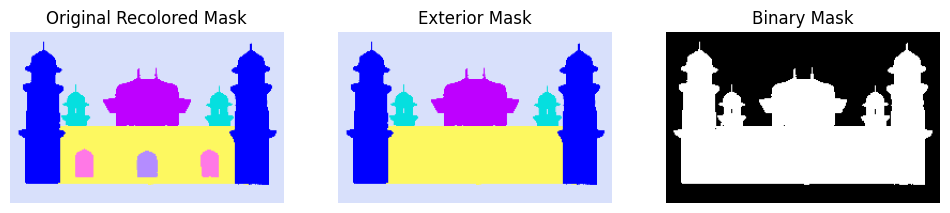

In [139]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ============================
# CONFIG
# ============================
root_path = "/home/sanju/mycode/O2P3D_final_paper/data/"
monuments = ["Akbar","Bibi","Charminar","Itimad","Taj"]

monument_name = monuments[3]
max_dim = 256

# ============================
# PART COLORS
# ============================
part_colors = {
    "full_building": (253, 248, 96),
    "chhatris": (1, 220, 5),
    "plinth": (63, 138, 173),
    "dome": (190, 0, 255),
    "front_minarets": (0, 0, 255),
    "back_minarets": (5, 223, 223),
    "small_minarets": (255, 180, 80),
    "main_door": (180, 140, 255),
    "windows": (255, 120, 230),
    "background": (216, 224, 251)
}
part_colors_np = {k: np.array(v) for k,v in part_colors.items()}

# ============================
# LOAD SEMANTIC MASK
# ============================
mask_path = os.path.join(root_path, monument_name, "masks")
mask_file = os.path.join(mask_path, f"{monument_name}_front_mask.png")
semantic_mask = cv2.cvtColor(cv2.imread(mask_file), cv2.COLOR_BGR2RGB)

# ============================
# INTERIOR MASK (main door + windows)
# ============================
interior_parts = ["main_door", "windows"]
interior_mask = np.any(
    [np.all(semantic_mask == part_colors_np[p], axis=-1) for p in interior_parts],
    axis=0
)

# ============================
# EXTERIOR MASK
# ============================
semantic_mask_exterior = semantic_mask.copy()
semantic_mask_exterior[interior_mask] = part_colors_np["full_building"]

# ============================
# RESIZE FOR DISPLAY
# ============================
def resize_to_max(img):
    h, w = img.shape[:2]
    scale = max_dim / max(h, w)
    return cv2.resize(img, (int(w*scale), int(h*scale)), cv2.INTER_NEAREST)

semantic_mask_resized = resize_to_max(semantic_mask)
semantic_mask_exterior_resized = resize_to_max(semantic_mask_exterior)
if monument_name == "Charminar":
    mask_file = os.path.join(mask_path, f"{monument_name}_front_mask_win.png")
    semantic_mask = cv2.cvtColor(cv2.imread(mask_file), cv2.COLOR_BGR2RGB)
    semantic_mask_resized = resize_to_max(semantic_mask)
# ============================
# BINARY MASK (foreground mask)
# ============================
inside_background = np.all(semantic_mask_exterior_resized == part_colors_np["background"], axis=-1)
binary_mask = (~inside_background).astype(np.uint8)

# ============================
# DISPLAY
# ============================
plt.figure(figsize=(12,4))
images = [
    (semantic_mask_resized, "Original Recolored Mask"),
    (semantic_mask_exterior_resized, "Exterior Mask"),
    (binary_mask, "Binary Mask")
]

for i, (img, title) in enumerate(images, 1):
    plt.subplot(1, 3, i)
    plt.imshow(img, cmap="gray" if title == "Binary Mask" else None)
    plt.title(title)
    plt.axis("off")

plt.show()


### 3. Global symmetric carving (stage 1)

In [ ]:
# -------------------------------------------------------------
# BUILD INITIAL VOXEL GRID
# -------------------------------------------------------------
h, w = binary_mask.shape
voxel_grid_building = np.ones([w, h, w])

# -------------------------------------------------------------
# WHOLE-BUILDING CARVING
# -------------------------------------------------------------
processed_grid = process_voxel_grid(
    voxel_grid_building,
    binary_mask,
    angle_interval=90
)

colored_voxel_grid = apply_colored_mask_to_voxel_grid(
    processed_grid,
    semantic_mask_exterior_resized
)
pts, cols, _ = voxel_grid_to_points(colored_voxel_grid,stride=5)
plot_voxel(pts,cols)

### 4. Part-wise symmetric carving (stage 2)

#### Apply global 4-way symmetry to each part

In [ ]:
group_jobs = [
    (["full_building"], 90),
    (["chhatris"], 90),
    (["plinth"], 90),
    (["front_minarets"], 90),
    # (["back_minarets"], 90),
    (["small_minarets"], 90),
    (["dome"], 90)
]

colored_part_grid = part_carve(
    colored_voxel_grid,
    semantic_mask_exterior_resized,
    visualize=False
)

pts, cols, _ = voxel_grid_to_points(colored_part_grid,stride=5)
plot_voxel(pts,cols)

#### Apply part-wise symmetry (tackle part with more components. eg: 4 chhatris, 4 minarets)

[[190   0 255]] Found 1 2D components
           Found 1 3D components
 - 3D Component 1 | BBox=(88,34,88)→(169,88,170)


90 Carving: 100%|███████████████████████████████| 19/19 [00:00<00:00, 30.59it/s]


   ✅ Carved voxels: 130305
[SKIP] No mask found for color [  1 220   5]
[[  0   0 255]] Found 2 2D components
           Found 4 3D components
 - 3D Component 1 | BBox=(8,11,8)→(52,142,52)


90 Carving: 100%|███████████████████████████████| 19/19 [00:00<00:00, 43.09it/s]


   ✅ Carved voxels: 88451
 - 3D Component 2 | BBox=(8,10,205)→(52,142,249)


90 Carving: 100%|███████████████████████████████| 19/19 [00:00<00:00, 42.97it/s]


   ✅ Carved voxels: 88025
 - 3D Component 3 | BBox=(205,11,8)→(249,142,52)


90 Carving: 100%|███████████████████████████████| 19/19 [00:00<00:00, 43.39it/s]


   ✅ Carved voxels: 77624
 - 3D Component 4 | BBox=(205,11,205)→(249,142,249)


90 Carving: 100%|███████████████████████████████| 19/19 [00:00<00:00, 43.08it/s]


   ✅ Carved voxels: 77553
[SKIP] No mask found for color [255 180  80]


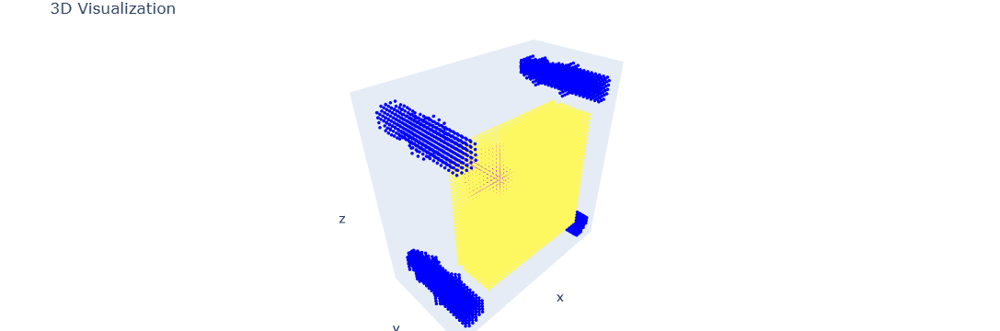

In [142]:
part_symmetry = {
    "dome": 5,
    "chhatris": 45,
    "front_minarets": 5,
    # "back_minarets": 5,
    "small_minarets": 5,
}

for part, angle in part_symmetry.items():
    colored_part_grid = left_right_guided_carve(
        colored_grid=colored_part_grid,
        semantic_mask=semantic_mask_exterior_resized,
        target_color=part_colors_np[part],
        angle=angle,
        visualize=False
    )

pts, cols, _ = voxel_grid_to_points(colored_part_grid,stride=5)
plot_voxel(pts,cols)


#### Paint interior regions (doors and windows)

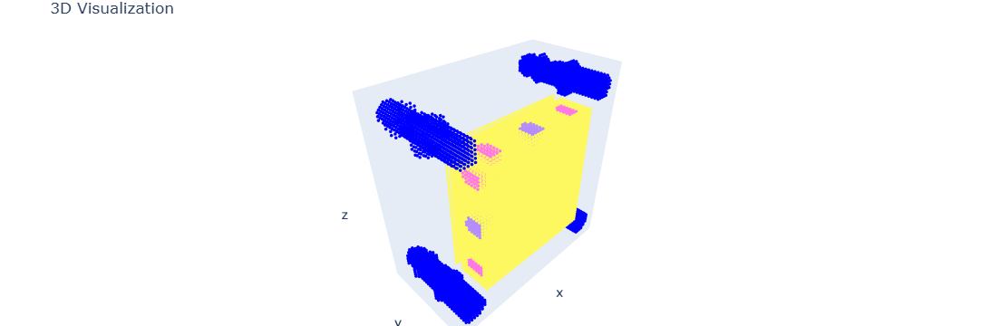

In [143]:
# ============================================
# INTERIOR EXTRUSION: DOORS + WINDOWS
# ============================================    
door_mask   = np.all(semantic_mask_resized == part_colors_np["main_door"], axis=-1)
window_mask = np.all(semantic_mask_resized == part_colors_np["windows"], axis=-1)

# Extrusion depths per part
extrusion_depths = {
    "main_door": 20,
    "windows": 10
}

def extrude_4dirs(grid, mask, depth, color):
    grid = extrude_from_surface(grid, mask, axis=2, direction='+', depth=depth, fill_color=color)
    grid = extrude_from_surface(grid, mask, axis=2, direction='-', depth=depth, fill_color=color)
    grid = extrude_from_surface(grid, mask, axis=0, direction='+', depth=depth, fill_color=color)
    grid = extrude_from_surface(grid, mask, axis=0, direction='-', depth=depth, fill_color=color)
    return grid

# Apply extrusion to windows
final_grid = extrude_4dirs(
    colored_part_grid,
    window_mask,
    extrusion_depths["windows"],
    part_colors_np["windows"]
)

# Apply extrusion to main door
final_grid = extrude_4dirs(
    final_grid,
    door_mask,
    extrusion_depths["main_door"],
    part_colors_np["main_door"]
)

pts, cols, _ = voxel_grid_to_points(final_grid,stride=4)
plot_voxel(pts,cols)

#### Recolor back minarets

In [144]:
# FIRST orient the voxel grid to final coordinate space:

# part_colors_np["front_minarets"], new_color=part_colors_np["back_minarets"]
recolored_grid = final_grid.transpose(2,1,0,3)
recolored_grid = np.flip(recolored_grid, axis=1)

# THEN recolor based on Z-axis (depth) in final view
voxel_grid = recolor_backward_components(recolored_grid, part_colors_np["front_minarets"], new_color=part_colors_np["back_minarets"], k=2, sort_axis=0)
pts, cols, _ = voxel_grid_to_points(voxel_grid,stride=5)
plot_voxel(pts,cols)

In [145]:
import numpy as np

# Detect front minarets (blue)
blue_mask = np.all(voxel_grid == part_colors_np["front_minarets"], axis=-1)
blue_coords = np.argwhere(blue_mask)

# Detect back minarets (new cyan)
cyan_mask = np.all(voxel_grid == part_colors_np["back_minarets"], axis=-1)
cyan_coords = np.argwhere(cyan_mask)

# Show Z-range (depth) for comparison
print(f"BLUE Z range: {blue_coords[:, 2].min()} → {blue_coords[:, 2].max()}")
print(f"CYAN Z range: {cyan_coords[:, 2].min()} → {cyan_coords[:, 2].max()}")


BLUE Z range: 9 → 248
CYAN Z range: 9 → 248


### 5. Save voxel grid

In [146]:
import os
import numpy as np

# Define the path where to save

save_dir = os.path.join(root_path,f"{monument_name}","initial 3D")
os.makedirs(save_dir, exist_ok=True)

# Name of the file to save
save_path = os.path.join(save_dir, f"{monument_name}_voxel_grid.npz")

# Save the filtered voxel grid
# np.savez_compressed(save_path, voxel_grid=final_grid1)
np.savez_compressed(save_path, voxel_grid=voxel_grid)


print(f"Filtered voxel grid saved to: {save_path}")


Filtered voxel grid saved to: /home/sanju/mycode/O2P3D_final_paper/data/Itimad/initial 3D/Itimad_voxel_grid.npz


### 6. Convert to mesh and visualize

In [ ]:
from skimage import measure
binary_volume = np.any(final_grid != 0, axis=-1)
verts_o, faces_o, _, _ = measure.marching_cubes(binary_volume, level=0.5)
# --- Create mesh plots (traces only) ---
mesh_orig = go.Mesh3d(
    x=verts_o[:, 0], y=verts_o[:, 1], z=verts_o[:, 2],
    i=faces_o[:, 0], j=faces_o[:, 1], k=faces_o[:, 2],
    color='magenta', opacity=0.8, name='Original Mesh'
)
fig = go.Figure()
fig.add_trace(mesh_orig)
fig.show()
